# 15. 문자를 읽을 수 있는 딥러닝

## 15-9. 프로젝트 : 다양한 OCR모델 비교하기

구현하고자 하는 서비스의 목적과 내용 : 

해외 여행을 다닐때, 그 나라의 언어를 알지 못해 번역기를 사용하는 상황이 자주 발생하는데,

글자 하나하나를 자판으로 치기보단 이미지를 인식해 전체적으로 빠르게 이미지를 번역하는것이 더 도움이 된다.

이를 바탕으로 여행을 다닐때 간판을 읽는다거나 메뉴를 볼때, 어떠한 상황에서 언어를 빠르고 확실하게 번역해 봐야할때 이 서비스를 사용한다고 가정해보자.


In [1]:
import keras_ocr
import pytesseract

print(keras_ocr.__version__)
print(pytesseract.__version__)
# pytesseract는 tesseract-ocr에 종속적입니다. 아래 명령어를 통해 설치해야 할 수도 있습니다.
# !sudo apt install tesseract-ocr

0.8.8
0.3.8


In [2]:
# # ERROR, pip dependency resolver/conflict 문구 해결

# !pip install imgaug==0.4.0
# !pip install tf-estimator-nightly==2.8.0.dev2021122109
# !pip install opencv-python-headless==4.1.2.30

In [3]:
# # 라이브러리 설치
# !pip install --upgrade matplotlib
# !sudo apt install tesseract-ocr
# !pip install google-cloud-vision keras_ocr pytesseract easyocr

### Step1. 검증용 데이터셋 준비

여행에 다닐때에는 다양한 글자의 양이나 폰트 등을 보기 때문에, 

데이터셋 이미지 또한 매우 다양한 경우로 준비해보았다.

In [34]:
import matplotlib.pyplot as plt
import keras_ocr
import cv2
import glob
import os
%matplotlib inline

In [5]:
import os
from glob import glob
import matplotlib.pyplot as plt
import matplotlib.image as img
%matplotlib inline

import keras_ocr

import pytesseract
from PIL import Image
from pytesseract import Output

In [6]:
work_dir = os.getenv('HOME')+'/aiffel/ocr_python/ocr_img/'

images = glob(work_dir+'*.png')
images.sort()
images

['/aiffel/aiffel/ocr_python/ocr_img/allarewelcome.png',
 '/aiffel/aiffel/ocr_python/ocr_img/backtoschool.png',
 '/aiffel/aiffel/ocr_python/ocr_img/beautiful.png',
 '/aiffel/aiffel/ocr_python/ocr_img/bestsummerever.png',
 '/aiffel/aiffel/ocr_python/ocr_img/code.png',
 '/aiffel/aiffel/ocr_python/ocr_img/dict.png',
 '/aiffel/aiffel/ocr_python/ocr_img/discovered.png',
 '/aiffel/aiffel/ocr_python/ocr_img/exit.png',
 '/aiffel/aiffel/ocr_python/ocr_img/joyjoy.png',
 '/aiffel/aiffel/ocr_python/ocr_img/liberty.png',
 '/aiffel/aiffel/ocr_python/ocr_img/liveworkcreate.png',
 '/aiffel/aiffel/ocr_python/ocr_img/loveandlove.png',
 '/aiffel/aiffel/ocr_python/ocr_img/november.png',
 '/aiffel/aiffel/ocr_python/ocr_img/poster.png',
 '/aiffel/aiffel/ocr_python/ocr_img/records.png',
 '/aiffel/aiffel/ocr_python/ocr_img/thishouse.png',
 '/aiffel/aiffel/ocr_python/ocr_img/wearecreatethefuture.png',
 '/aiffel/aiffel/ocr_python/ocr_img/welikeyoutoo.png',
 '/aiffel/aiffel/ocr_python/ocr_img/workandplay.png',
 '

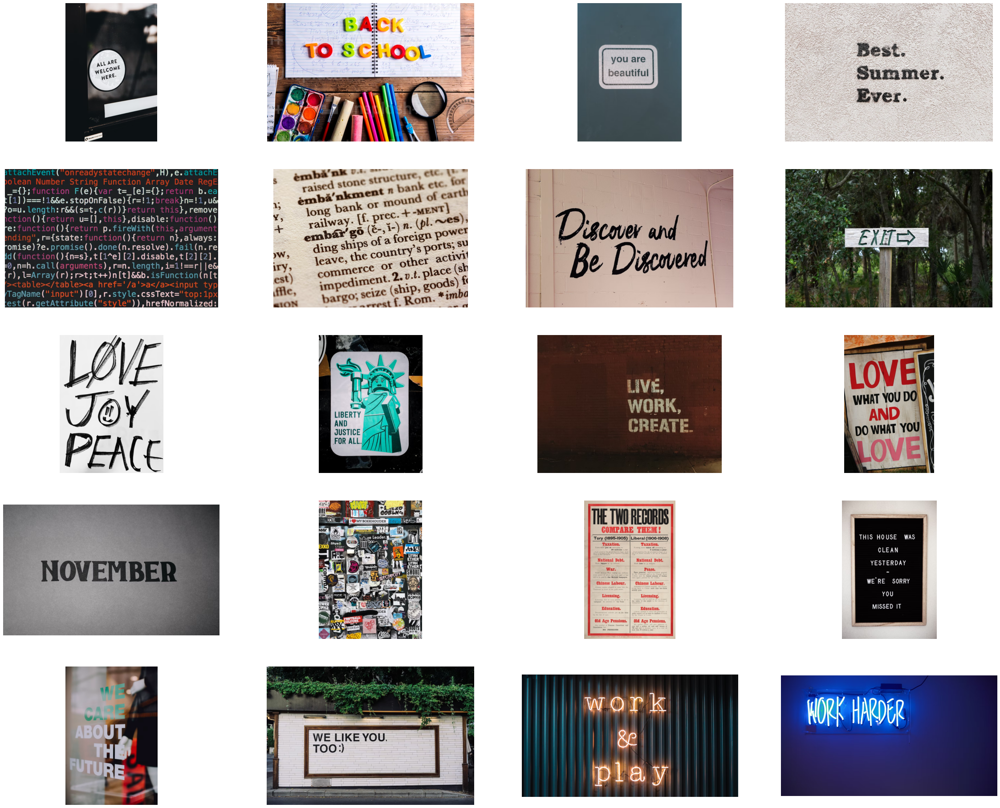

In [7]:
plt.figure(figsize=(40,40))

for idx, im in enumerate(images):
    plt.subplot(6, 4, idx+1)
    im = img.imread(im)
    plt.imshow(im)
    plt.axis('off')

In [8]:
# 파일을 불러오는 과정에서 오류가 발생해서
# 어떤 파일이 오류가 있는지 확인해보기위한 작업을 진행
# 오류가 발생한 파일의 경우 except구문을 타고 파일이름이 print된다.

import PIL
from pathlib import Path
from PIL import UnidentifiedImageError

path = Path(os.getenv('HOME')+'/aiffel/ocr_python/ocr_img/').rglob("*.png")
for img_p in path:
    try:
        img = PIL.Image.open(img_p)
    except PIL.UnidentifiedImageError:
            print("error")
            print(img_p)

### Step2. keras-ocr, Tesseract로 테스트 진행(Google OCR API는 선택 사항)

##### keras-ocr

##### keras-ocr의 경우 준비된 데이터셋과 동일하지만 이미지의 url을 불러와서 테스트 진행

In [9]:
pipeline = keras_ocr.pipeline.Pipeline()

Looking for /aiffel/.keras-ocr/craft_mlt_25k.h5
Looking for /aiffel/.keras-ocr/crnn_kurapan.h5


In [10]:
# 테스트에 사용할 이미지 url을 모아 봅니다. 추가로 더 모아볼 수도 있습니다. 
image_urls = [
  'https://images.unsplash.com/photo-1548722038-fbe52045aa57?ixlib=rb-4.0.3&ixid=MnwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8&auto=format&fit=crop&w=733&q=80',
  'https://images.unsplash.com/photo-1516383740770-fbcc5ccbece0?ixlib=rb-4.0.3&ixid=MnwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8&auto=format&fit=crop&w=1074&q=80',
  'https://images.unsplash.com/photo-1524475922556-171e86798684?ixlib=rb-4.0.3&ixid=MnwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8&auto=format&fit=crop&w=676&q=80',
  'https://images.unsplash.com/photo-1494871262121-49703fd34e2b?ixlib=rb-4.0.3&ixid=MnwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8&auto=format&fit=crop&w=1170&q=80',
  'https://images.unsplash.com/photo-1587671369229-c41dd67be237?ixlib=rb-4.0.3&ixid=MnwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8&auto=format&fit=crop&w=687&q=80',
  'https://images.unsplash.com/photo-1553268107-a74f013ceb59?ixlib=rb-4.0.3&ixid=MnwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8&auto=format&fit=crop&w=699&q=80',
  'https://images.unsplash.com/photo-1592168865720-df6eec2632d9?ixlib=rb-4.0.3&ixid=MnwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8&auto=format&fit=crop&w=735&q=80',
  'https://images.unsplash.com/photo-1468971050039-be99497410af?ixlib=rb-4.0.3&ixid=MnwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8&auto=format&fit=crop&w=1332&q=80',
  'https://images.unsplash.com/photo-1555323912-3526a765162b?ixlib=rb-4.0.3&ixid=MnwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8&auto=format&fit=crop&w=1334&q=80',
  'https://images.unsplash.com/photo-1516259762381-22954d7d3ad2?ixlib=rb-4.0.3&ixid=MnwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8&auto=format&fit=crop&w=1189&q=80',
  'https://images.unsplash.com/photo-1598729512070-b2ee1524ce13?ixlib=rb-4.0.3&ixid=MnwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8&auto=format&fit=crop&w=687&q=80',
  'https://plus.unsplash.com/premium_photo-1663127354216-8d06d01b8775?ixlib=rb-4.0.3&ixid=MnwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8&auto=format&fit=crop&w=1170&q=80',
  'https://images.unsplash.com/photo-1552154083-5ab46bcc4515?ixlib=rb-4.0.3&ixid=MnwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8&auto=format&fit=crop&w=1170&q=80',
  'https://images.unsplash.com/photo-1495106245177-55dc6f43e83f?ixlib=rb-4.0.3&ixid=MnwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8&auto=format&fit=crop&w=1170&q=80',
  'https://images.unsplash.com/photo-1604440976409-d70080acb7d8?ixlib=rb-4.0.3&ixid=MnwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8&auto=format&fit=crop&w=1253&q=80',
  'https://images.unsplash.com/photo-1573434490486-3cab65054136?ixlib=rb-4.0.3&ixid=MnwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8&auto=format&fit=crop&w=736&q=80',
  'https://images.unsplash.com/photo-1543123452-278551b0e9a7?ixlib=rb-4.0.3&ixid=MnwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8&auto=format&fit=crop&w=735&q=80',
  'https://images.unsplash.com/photo-1556696863-6c5eddae0f5f?ixlib=rb-4.0.3&ixid=MnwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8&auto=format&fit=crop&w=1112&q=80',
  'https://images.unsplash.com/photo-1588003018536-3e9e55905213?ixlib=rb-4.0.3&ixid=MnwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8&auto=format&fit=crop&w=684&q=80',
   'https://images.unsplash.com/photo-1609375457088-84cb07bc8021?ixlib=rb-4.0.3&ixid=MnwxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8&auto=format&fit=crop&w=1170&q=80'
]

images = [ keras_ocr.tools.read(url) for url in image_urls]
prediction_groups = [pipeline.recognize([url]) for url in image_urls]

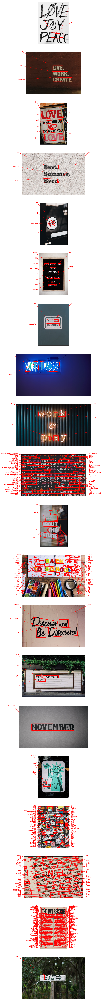

In [11]:
# Plot the predictions
fig, axs = plt.subplots(nrows=len(images), figsize=(160,160))
for idx, ax in enumerate(axs):
    keras_ocr.tools.drawAnnotations(image=images[idx], 
                                    predictions=prediction_groups[idx][0], ax=ax)

#### 테서랙트(Tesseract)

In [12]:
import os
import pytesseract
from PIL import Image
from pytesseract import Output
import matplotlib.pyplot as plt

# OCR Engine modes(–oem):
# 0 - Legacy engine only.
# 1 - Neural nets LSTM engine only.
# 2 - Legacy + LSTM engines.
# 3 - Default, based on what is available.

# Page segmentation modes(–psm):
# 0 - Orientation and script detection (OSD) only.
# 1 - Automatic page segmentation with OSD.
# 2 - Automatic page segmentation, but no OSD, or OCR.
# 3 - Fully automatic page segmentation, but no OSD. (Default)
# 4 - Assume a single column of text of variable sizes.
# 5 - Assume a single uniform block of vertically aligned text.
# 6 - Assume a single uniform block of text.
# 7 - Treat the image as a single text line.
# 8 - Treat the image as a single word.
# 9 - Treat the image as a single word in a circle.
# 10 - Treat the image as a single character.
# 11 - Sparse text. Find as much text as possible in no particular order.
# 12 - Sparse text with OSD.
# 13 - Raw line. Treat the image as a single text line, bypassing hacks that are Tesseract-specific.

def crop_word_regions(image_path='./images/sample.png', output_path='./output'):
    if not os.path.exists(output_path):
        os.mkdir(output_path)
    custom_oem_psm_config = r'--oem 3 --psm 3'
    image = Image.open(image_path)

    recognized_data = pytesseract.image_to_data(
        image, lang='eng',    # 한국어라면 lang='kor'
        config=custom_oem_psm_config,
        output_type=Output.DICT
    )
    
    top_level = max(recognized_data['level'])
    index = 0
    cropped_image_path_list = []
    for i in range(len(recognized_data['level'])):
        level = recognized_data['level'][i]
    
        if level == top_level:
            left = recognized_data['left'][i]
            top = recognized_data['top'][i]
            width = recognized_data['width'][i]
            height = recognized_data['height'][i]
            
            output_img_path = os.path.join(output_path, f"{str(index).zfill(4)}.png")
            print(output_img_path)
            cropped_image = image.crop((
                left,
                top,
                left+width,
                top+height
            ))
            cropped_image.save(output_img_path)
            cropped_image_path_list.append(output_img_path)
            index += 1
    return cropped_image_path_list




In [14]:
work_dir = os.getenv('HOME')+'/aiffel/ocr_python/ocr_img'
img_file_path = work_dir + '/joyjoy.png'  

cropped_image_path_list = crop_word_regions(img_file_path, work_dir)


/aiffel/aiffel/ocr_python/ocr_img/0000.png


In [15]:
# 이미지에서 문자 인식하는 함수
def recognize_images(cropped_image_path_list):
    custom_oem_psm_config = r'--oem 3 --psm 7'
    
    for image_path in cropped_image_path_list:
        image = Image.open(image_path)
        recognized_data = pytesseract.image_to_string(
            image, lang='eng',    # 한국어라면 lang='kor'
            config=custom_oem_psm_config,
            output_type=Output.DICT
        )
        print(recognized_data['text'])
    print("Done")
    

# 위에서 준비한 문자 영역 파일들을 인식하여 얻어진 텍스트를 출력합니다.
recognize_images(cropped_image_path_list)


Done


In [16]:
work_dir = os.getenv('HOME')+'/aiffel/ocr_python/ocr_img'
img_file_path = work_dir + '/liveworkcreate.png'  

cropped_image_path_list = crop_word_regions(img_file_path, work_dir)
recognize_images(cropped_image_path_list)

/aiffel/aiffel/ocr_python/ocr_img/0000.png
/aiffel/aiffel/ocr_python/ocr_img/0001.png
/aiffel/aiffel/ocr_python/ocr_img/0002.png
wih

Buea


Done


In [17]:
work_dir = os.getenv('HOME')+'/aiffel/ocr_python/ocr_img'
img_file_path = work_dir + '/loveandlove.png'  

cropped_image_path_list = crop_word_regions(img_file_path, work_dir)
recognize_images(cropped_image_path_list)

/aiffel/aiffel/ocr_python/ocr_img/0000.png
si =

Done


In [18]:
work_dir = os.getenv('HOME')+'/aiffel/ocr_python/ocr_img'
img_file_path = work_dir + '/allarewelcome.png'  

cropped_image_path_list = crop_word_regions(img_file_path, work_dir)
recognize_images(cropped_image_path_list)

/aiffel/aiffel/ocr_python/ocr_img/0000.png

Done


In [19]:
work_dir = os.getenv('HOME')+'/aiffel/ocr_python/ocr_img'
img_file_path = work_dir + '/thishouse.png'  

cropped_image_path_list = crop_word_regions(img_file_path, work_dir)
recognize_images(cropped_image_path_list)

/aiffel/aiffel/ocr_python/ocr_img/0000.png
/aiffel/aiffel/ocr_python/ocr_img/0001.png
/aiffel/aiffel/ocr_python/ocr_img/0002.png
/aiffel/aiffel/ocr_python/ocr_img/0003.png
/aiffel/aiffel/ocr_python/ocr_img/0004.png
/aiffel/aiffel/ocr_python/ocr_img/0005.png
/aiffel/aiffel/ocr_python/ocr_img/0006.png
/aiffel/aiffel/ocr_python/ocr_img/0007.png
/aiffel/aiffel/ocr_python/ocr_img/0008.png
/aiffel/aiffel/ocr_python/ocr_img/0009.png
/aiffel/aiffel/ocr_python/ocr_img/0010.png
/aiffel/aiffel/ocr_python/ocr_img/0011.png
inSain

HOUSE

YES

a oww

ato

TERDAY

v/a 1 5

SORRY

Are

MISSED

3

=

Done


In [20]:
work_dir = os.getenv('HOME')+'/aiffel/ocr_python/ocr_img'
img_file_path = work_dir + '/beautiful.png'  

cropped_image_path_list = crop_word_regions(img_file_path, work_dir)
recognize_images(cropped_image_path_list)

/aiffel/aiffel/ocr_python/ocr_img/0000.png
/aiffel/aiffel/ocr_python/ocr_img/0001.png
/aiffel/aiffel/ocr_python/ocr_img/0002.png
/aiffel/aiffel/ocr_python/ocr_img/0003.png
You

are

yjeautitul

—

Done


In [21]:
work_dir = os.getenv('HOME')+'/aiffel/ocr_python/ocr_img'
img_file_path = work_dir + '/workharder.png'  

cropped_image_path_list = crop_word_regions(img_file_path, work_dir)
recognize_images(cropped_image_path_list)

/aiffel/aiffel/ocr_python/ocr_img/0000.png
HORK HARDER

Done


In [22]:
work_dir = os.getenv('HOME')+'/aiffel/ocr_python/ocr_img'
img_file_path = work_dir + '/workandplay.png'  

cropped_image_path_list = crop_word_regions(img_file_path, work_dir)
recognize_images(cropped_image_path_list)

/aiffel/aiffel/ocr_python/ocr_img/0000.png
/aiffel/aiffel/ocr_python/ocr_img/0001.png
/aiffel/aiffel/ocr_python/ocr_img/0002.png
/aiffel/aiffel/ocr_python/ocr_img/0003.png
/aiffel/aiffel/ocr_python/ocr_img/0004.png
/aiffel/aiffel/ocr_python/ocr_img/0005.png
/aiffel/aiffel/ocr_python/ocr_img/0006.png
/aiffel/aiffel/ocr_python/ocr_img/0007.png
/aiffel/aiffel/ocr_python/ocr_img/0008.png
/aiffel/aiffel/ocr_python/ocr_img/0009.png
/aiffel/aiffel/ocr_python/ocr_img/0010.png
/aiffel/aiffel/ocr_python/ocr_img/0011.png
/aiffel/aiffel/ocr_python/ocr_img/0012.png
/aiffel/aiffel/ocr_python/ocr_img/0013.png


|


a










Done


In [23]:
work_dir = os.getenv('HOME')+'/aiffel/ocr_python/ocr_img'
img_file_path = work_dir + '/code.png'  

cropped_image_path_list = crop_word_regions(img_file_path, work_dir)
recognize_images(cropped_image_path_list)

/aiffel/aiffel/ocr_python/ocr_img/0000.png
/aiffel/aiffel/ocr_python/ocr_img/0001.png
/aiffel/aiffel/ocr_python/ocr_img/0002.png
/aiffel/aiffel/ocr_python/ocr_img/0003.png
/aiffel/aiffel/ocr_python/ocr_img/0004.png
/aiffel/aiffel/ocr_python/ocr_img/0005.png
/aiffel/aiffel/ocr_python/ocr_img/0006.png
/aiffel/aiffel/ocr_python/ocr_img/0007.png
/aiffel/aiffel/ocr_python/ocr_img/0008.png
/aiffel/aiffel/ocr_python/ocr_img/0009.png
/aiffel/aiffel/ocr_python/ocr_img/0010.png
/aiffel/aiffel/ocr_python/ocr_img/0011.png
/aiffel/aiffel/ocr_python/ocr_img/0012.png
/aiffel/aiffel/ocr_python/ocr_img/0013.png
/aiffel/aiffel/ocr_python/ocr_img/0014.png
/aiffel/aiffel/ocr_python/ocr_img/0015.png
/aiffel/aiffel/ocr_python/ocr_img/0016.png
/aiffel/aiffel/ocr_python/ocr_img/0017.png
/aiffel/aiffel/ocr_python/ocr_img/0018.png
/aiffel/aiffel/ocr_python/ocr_img/0019.png
/aiffel/aiffel/ocr_python/ocr_img/0020.png
/aiffel/aiffel/ocr_python/ocr_img/0021.png
/aiffel/aiffel/ocr_python/ocr_img/0022.png
/aiffel/aif

In [24]:
work_dir = os.getenv('HOME')+'/aiffel/ocr_python/ocr_img'
img_file_path = work_dir + '/wearecreatethefuture.png'  

cropped_image_path_list = crop_word_regions(img_file_path, work_dir)
recognize_images(cropped_image_path_list)

/aiffel/aiffel/ocr_python/ocr_img/0000.png

Done


In [25]:
work_dir = os.getenv('HOME')+'/aiffel/ocr_python/ocr_img'
img_file_path = work_dir + '/backtoschool.png'  

cropped_image_path_list = crop_word_regions(img_file_path, work_dir)
recognize_images(cropped_image_path_list)

/aiffel/aiffel/ocr_python/ocr_img/0000.png
nll

Done


In [26]:
work_dir = os.getenv('HOME')+'/aiffel/ocr_python/ocr_img'
img_file_path = work_dir + '/discovered.png'  

cropped_image_path_list = crop_word_regions(img_file_path, work_dir)
recognize_images(cropped_image_path_list)

/aiffel/aiffel/ocr_python/ocr_img/0000.png
/aiffel/aiffel/ocr_python/ocr_img/0001.png
/aiffel/aiffel/ocr_python/ocr_img/0002.png
/aiffel/aiffel/ocr_python/ocr_img/0003.png
/aiffel/aiffel/ocr_python/ocr_img/0004.png
/aiffel/aiffel/ocr_python/ocr_img/0005.png
/aiffel/aiffel/ocr_python/ocr_img/0006.png
/aiffel/aiffel/ocr_python/ocr_img/0007.png
|

Discover ard

AN

|

Be

Digeoers

:


Done


In [27]:
work_dir = os.getenv('HOME')+'/aiffel/ocr_python/ocr_img'
img_file_path = work_dir + '/welikeyoutoo.png'  

cropped_image_path_list = crop_word_regions(img_file_path, work_dir)
recognize_images(cropped_image_path_list)

/aiffel/aiffel/ocr_python/ocr_img/0000.png
7 ol}

Done


In [28]:
work_dir = os.getenv('HOME')+'/aiffel/ocr_python/ocr_img'
img_file_path = work_dir + '/november.png'  

cropped_image_path_list = crop_word_regions(img_file_path, work_dir)
recognize_images(cropped_image_path_list)

/aiffel/aiffel/ocr_python/ocr_img/0000.png

Done


In [29]:
work_dir = os.getenv('HOME')+'/aiffel/ocr_python/ocr_img'
img_file_path = work_dir + '/liberty.png'  

cropped_image_path_list = crop_word_regions(img_file_path, work_dir)
recognize_images(cropped_image_path_list)

/aiffel/aiffel/ocr_python/ocr_img/0000.png
Ei

Done


In [30]:
work_dir = os.getenv('HOME')+'/aiffel/ocr_python/ocr_img'
img_file_path = work_dir + '/poster.png'  

cropped_image_path_list = crop_word_regions(img_file_path, work_dir)
recognize_images(cropped_image_path_list)

/aiffel/aiffel/ocr_python/ocr_img/0000.png

Done


In [31]:
work_dir = os.getenv('HOME')+'/aiffel/ocr_python/ocr_img'
img_file_path = work_dir + '/dict.png'  

cropped_image_path_list = crop_word_regions(img_file_path, work_dir)
recognize_images(cropped_image_path_list)

/aiffel/aiffel/ocr_python/ocr_img/0000.png
/aiffel/aiffel/ocr_python/ocr_img/0001.png
/aiffel/aiffel/ocr_python/ocr_img/0002.png
/aiffel/aiffel/ocr_python/ocr_img/0003.png
/aiffel/aiffel/ocr_python/ocr_img/0004.png
/aiffel/aiffel/ocr_python/ocr_img/0005.png
/aiffel/aiffel/ocr_python/ocr_img/0006.png
/aiffel/aiffel/ocr_python/ocr_img/0007.png
/aiffel/aiffel/ocr_python/ocr_img/0008.png
/aiffel/aiffel/ocr_python/ocr_img/0009.png
/aiffel/aiffel/ocr_python/ocr_img/0010.png
/aiffel/aiffel/ocr_python/ocr_img/0011.png
/aiffel/aiffel/ocr_python/ocr_img/0012.png
/aiffel/aiffel/ocr_python/ocr_img/0013.png
/aiffel/aiffel/ocr_python/ocr_img/0014.png
/aiffel/aiffel/ocr_python/ocr_img/0015.png
/aiffel/aiffel/ocr_python/ocr_img/0016.png
/aiffel/aiffel/ocr_python/ocr_img/0017.png
/aiffel/aiffel/ocr_python/ocr_img/0018.png
/aiffel/aiffel/ocr_python/ocr_img/0019.png
/aiffel/aiffel/ocr_python/ocr_img/0020.png
/aiffel/aiffel/ocr_python/ocr_img/0021.png
/aiffel/aiffel/ocr_python/ocr_img/0022.png
/aiffel/aif

In [32]:
work_dir = os.getenv('HOME')+'/aiffel/ocr_python/ocr_img'
img_file_path = work_dir + '/records.png'  

cropped_image_path_list = crop_word_regions(img_file_path, work_dir)
recognize_images(cropped_image_path_list)

/aiffel/aiffel/ocr_python/ocr_img/0000.png
/aiffel/aiffel/ocr_python/ocr_img/0001.png
/aiffel/aiffel/ocr_python/ocr_img/0002.png
/aiffel/aiffel/ocr_python/ocr_img/0003.png
/aiffel/aiffel/ocr_python/ocr_img/0004.png
/aiffel/aiffel/ocr_python/ocr_img/0005.png
/aiffel/aiffel/ocr_python/ocr_img/0006.png
/aiffel/aiffel/ocr_python/ocr_img/0007.png
/aiffel/aiffel/ocr_python/ocr_img/0008.png
/aiffel/aiffel/ocr_python/ocr_img/0009.png
/aiffel/aiffel/ocr_python/ocr_img/0010.png
/aiffel/aiffel/ocr_python/ocr_img/0011.png
/aiffel/aiffel/ocr_python/ocr_img/0012.png
/aiffel/aiffel/ocr_python/ocr_img/0013.png
/aiffel/aiffel/ocr_python/ocr_img/0014.png
/aiffel/aiffel/ocr_python/ocr_img/0015.png
/aiffel/aiffel/ocr_python/ocr_img/0016.png
/aiffel/aiffel/ocr_python/ocr_img/0017.png
/aiffel/aiffel/ocr_python/ocr_img/0018.png
/aiffel/aiffel/ocr_python/ocr_img/0019.png
/aiffel/aiffel/ocr_python/ocr_img/0020.png
/aiffel/aiffel/ocr_python/ocr_img/0021.png
/aiffel/aiffel/ocr_python/ocr_img/0022.png
/aiffel/aif

### Step3. 테스트 결과 정리 + Step4. 결과 분석과 결론 제시

keras-ocr의 경우,


전체적으로 인식을 잘 한것들이 많았다.

글자가 여러겹으로 이루어지거나 크기가 많이 클 경우, 글자 외에도 :) 와같은 기호들도 문자로 인식해버리는경우가 있어서 아쉬움은 있었다.

하지만 대부분의 모든 글씨의 경우에서 높은 확률로 인식한 결과가 좋제 나왔다.

tesseract의 경우,

keras-ocr에 비해서 글자로 인식하는것들이 많지 않았었다.

대부분 잘 인식하지 못하는 경우가 많았고, 인식결과가 keras-ocr과 비교해보았을때, 현저히 떨어지는것을 볼 수 있었다.

테스트 이미지를 기반으로 결과를 생각해보았을때,

기획한 서비스의 경우 빠른 번역을 위해 다양한 폰트, 글자의 양을 한번에 그리고 정확하게 번역해야하기때문에

OCR이 적용 가능한 서비스라고 생각하며, 이 경우 keras-ocr을 사용하는것이 더 적합할 것이라는 판단이 들었다.



## 회고

초반에 데이터셋을 불러올때 자꾸 경로 오류가 발생해서 어느 부분이 잘 못되었는지 갈피를 잡지 못했었다.

여러가지를 시도해보며 알게된것은 데이터셋 이미지를 저장하는 과정에서 이미지가 찾을 수 없는 이미지인것을 알게되었고 

해당 이미지가 파일은 클라우드에 올라가있었지만 올바르지 않은 파일 구조를 하고있기에 발생하는 오류라는 것을 알 수 있었고 해결할 수 있었다.

keras-ocr과 tesseract를 해보면서 google ocr api도 사용해보고 비교해 보는 것도 해보고 싶어졌다.